Initializing Swin Transformer Explainer with Key Layer Attention Analysis...
Key layers: Low (first) → Middle → Final (last)
Using device: cuda
Loading swin_model_overfit_1...
 swin_model_overfit_1 loaded successfully
Loading swin_model_regularized_1...
 swin_model_regularized_1 loaded successfully
Loading swin_model_regularized_2...
 swin_model_regularized_2 loaded successfully
Loading swin_model_regularized_3...
 swin_model_regularized_3 loaded successfully
Loading swin_model_regularized_5...
 swin_model_regularized_5 loaded successfully
Loading swin_model_regularized_6...
 swin_model_regularized_6 loaded successfully
Loading swin_model_regularized_7...
 swin_model_regularized_7 loaded successfully
Successfully loaded 7 Swin Transformer models
Found 2 images in /content/test_images
Using attention method: saliency
Layer strategy: key_layers, Head fusion: mean

[1/2] Elimar_19MB.png
------------------------------------------------------------
Processing: /content/test_images/Elimar_19

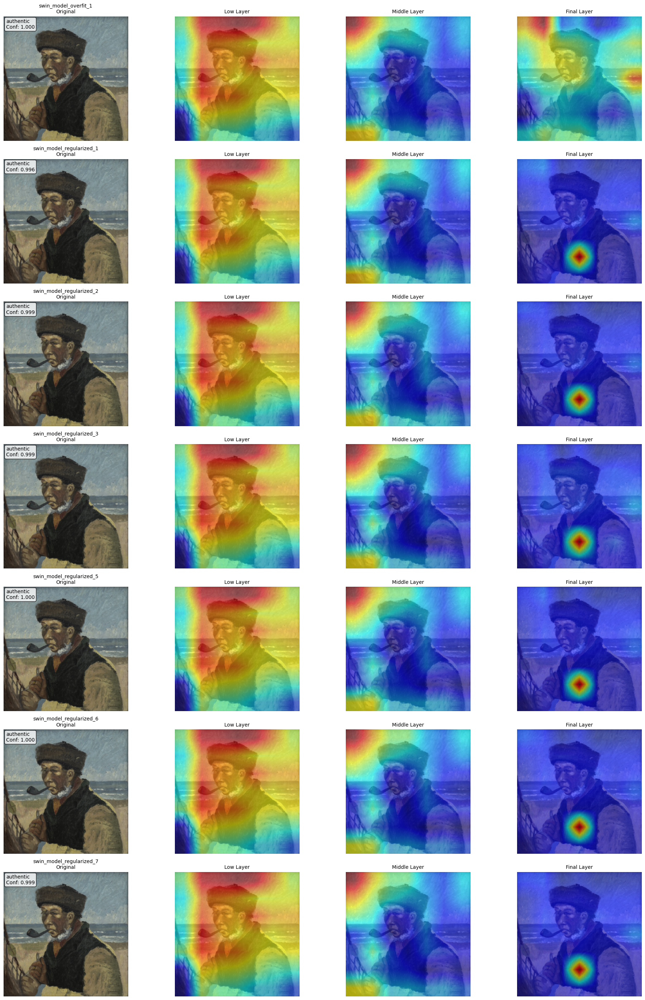

Key layer attention visualizations saved as: Elimar_19MB_attention_key_layers_saliency_mean.png
swin_model_overfit_1           (Swin v0        ): authentic  | Conf: 1.000 | Auth: 1.000 | Imit: 0.000
swin_model_regularized_1       (Swin v1        ): authentic  | Conf: 0.996 | Auth: 0.996 | Imit: 0.004
swin_model_regularized_2       (Swin v2        ): authentic  | Conf: 0.999 | Auth: 0.999 | Imit: 0.001
swin_model_regularized_3       (Swin v3        ): authentic  | Conf: 0.999 | Auth: 0.999 | Imit: 0.001
swin_model_regularized_5       (Swin v5        ): authentic  | Conf: 1.000 | Auth: 1.000 | Imit: 0.000
swin_model_regularized_6       (Swin v6        ): authentic  | Conf: 1.000 | Auth: 1.000 | Imit: 0.000
swin_model_regularized_7       (Swin v7        ): authentic  | Conf: 0.999 | Auth: 0.999 | Imit: 0.001

[2/2] Elimar_9MB.jpg
------------------------------------------------------------
Processing: /content/test_images/Elimar_9MB.jpg
  Running swin_model_overfit_1...
    swin_model_ove

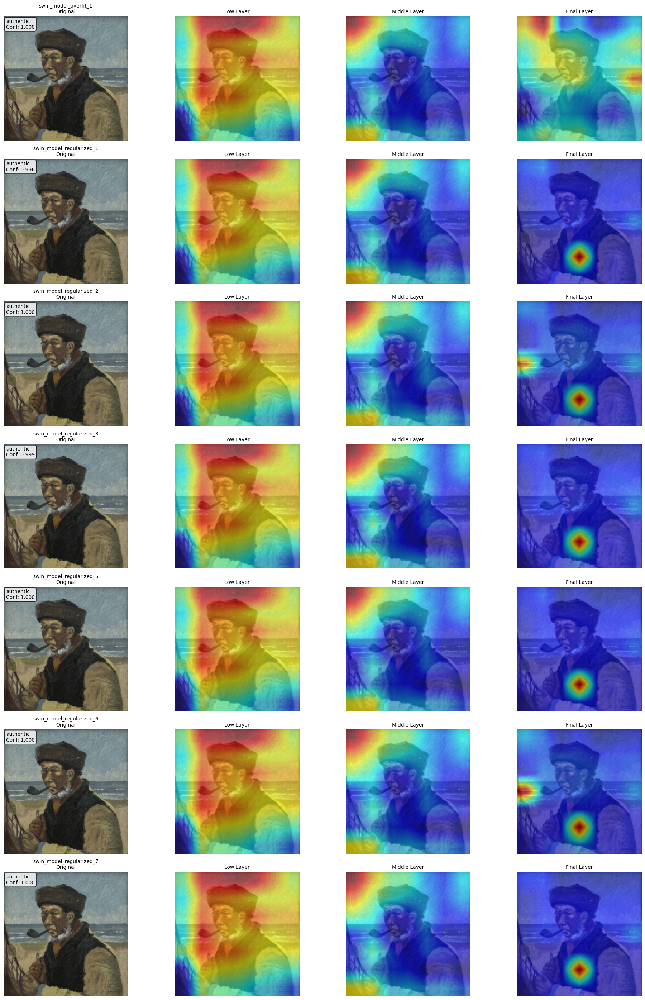

Key layer attention visualizations saved as: Elimar_9MB_attention_key_layers_saliency_mean.png
swin_model_overfit_1           (Swin v0        ): authentic  | Conf: 1.000 | Auth: 1.000 | Imit: 0.000
swin_model_regularized_1       (Swin v1        ): authentic  | Conf: 0.996 | Auth: 0.996 | Imit: 0.004
swin_model_regularized_2       (Swin v2        ): authentic  | Conf: 1.000 | Auth: 1.000 | Imit: 0.000
swin_model_regularized_3       (Swin v3        ): authentic  | Conf: 0.999 | Auth: 0.999 | Imit: 0.001
swin_model_regularized_5       (Swin v5        ): authentic  | Conf: 1.000 | Auth: 1.000 | Imit: 0.000
swin_model_regularized_6       (Swin v6        ): authentic  | Conf: 1.000 | Auth: 1.000 | Imit: 0.000
swin_model_regularized_7       (Swin v7        ): authentic  | Conf: 1.000 | Auth: 1.000 | Imit: 0.000

Processing completed!
Attention visualizations show progression from:
  • Low layer: Basic feature detection
  • Middle layer: Intermediate patterns
  • Final layer: High-level semant

In [4]:
import torch
import torch.nn.functional as F
import timm
import numpy as np
from PIL import Image
import torchvision.transforms as transforms
from pathlib import Path
import json
from datetime import datetime
import pandas as pd
import os
from typing import List, Dict
import cv2
import matplotlib.pyplot as plt
from matplotlib import gridspec
import math

class SwinAttentionSaliencyExplainer:
    """
    Swin Transformer explainability using attention-based saliency maps
    Extracts and visualizes actual attention weights from the transformer
    """

    def __init__(self, model, device):
        self.model = model
        self.device = device
        self.attention_weights = {}
        self.hooks = []
        self.original_methods = {}
        self._patch_attention_modules()

    def _patch_attention_modules(self):
        """Patch WindowAttention modules to capture attention weights"""

        def create_attention_hook(layer_name):
            def patched_forward(*args, **kwargs):
                # args[0] is self (the WindowAttention module)
                # args[1] is x (the input tensor)
                self_attn = args[0]
                x = args[1]
                mask = args[2] if len(args) > 2 else kwargs.get('mask', None)

                B_, N, C = x.shape
                qkv = self_attn.qkv(x).reshape(B_, N, 3, self_attn.num_heads, C // self_attn.num_heads).permute(2, 0, 3, 1, 4)
                q, k, v = qkv[0], qkv[1], qkv[2]

                q = q * self_attn.scale
                attn = (q @ k.transpose(-2, -1))

                relative_position_bias = self_attn.relative_position_bias_table[
                    self_attn.relative_position_index.view(-1)].view(
                    self_attn.window_size[0] * self_attn.window_size[1],
                    self_attn.window_size[0] * self_attn.window_size[1], -1)
                relative_position_bias = relative_position_bias.permute(2, 0, 1).contiguous()
                attn = attn + relative_position_bias.unsqueeze(0)

                if mask is not None:
                    nW = mask.shape[0]
                    attn = attn.view(B_ // nW, nW, self_attn.num_heads, N, N) + mask.unsqueeze(1).unsqueeze(0)
                    attn = attn.view(-1, self_attn.num_heads, N, N)

                # Apply softmax and CAPTURE attention weights
                attn = F.softmax(attn, dim=-1)

                # Store attention weights - this is what we want for saliency
                explainer.attention_weights[layer_name] = attn.detach().clone()

                attn = self_attn.attn_drop(attn)
                x = (attn @ v).transpose(1, 2).reshape(B_, N, C)
                x = self_attn.proj(x)
                x = self_attn.proj_drop(x)
                return x

            return patched_forward

        explainer = self  # Reference for closure

        # Patch each WindowAttention module
        for layer_idx, layer in enumerate(self.model.layers):
            for block_idx, block in enumerate(layer.blocks):
                if hasattr(block, 'attn') and hasattr(block.attn, 'qkv'):
                    layer_name = f"layer_{layer_idx}_block_{block_idx}"

                    # Store original method
                    self.original_methods[layer_name] = block.attn.forward

                    # Create patched method
                    patched_method = create_attention_hook(layer_name)

                    # Replace with patched method using proper binding
                    import types
                    block.attn.forward = types.MethodType(patched_method, block.attn)

    def generate_attention_saliency(self, input_tensor, target_class=None, layer_strategy='key_layers', head_fusion='mean'):
        """
        Generate attention-based saliency map

        Args:
            input_tensor: Input image tensor [1, 3, H, W]
            target_class: Target class (not used for attention, but kept for consistency)
            layer_strategy: 'key_layers' for low/middle/final, 'last', 'first', or specific layer index
            head_fusion: How to combine attention heads ('mean', 'max', 'min')
        """
        self.attention_weights.clear()

        # Forward pass to capture attention weights
        with torch.no_grad():
            _ = self.model(input_tensor)

        if not self.attention_weights:
            print("Warning: No attention weights captured!")
            return np.random.random((8, 8))

        # If key_layers, return attention maps from low, middle, and final layers
        if layer_strategy == 'key_layers':
            return self._generate_key_layer_attention(head_fusion)

        # Select which layer's attention to use for single layer strategies
        if layer_strategy == 'last':
            layer_names = sorted(self.attention_weights.keys())
            selected_attention = self.attention_weights[layer_names[-1]]
        elif layer_strategy == 'first':
            layer_names = sorted(self.attention_weights.keys())
            selected_attention = self.attention_weights[layer_names[0]]
        else:
            # Use specific layer
            layer_name = f"layer_{layer_strategy}_block_0"
            if layer_name in self.attention_weights:
                selected_attention = self.attention_weights[layer_name]
            else:
                print(f"Layer {layer_name} not found, using last layer")
                layer_names = sorted(self.attention_weights.keys())
                selected_attention = self.attention_weights[layer_names[-1]]

        return self._process_single_layer_attention(selected_attention, head_fusion)

    def _generate_key_layer_attention(self, head_fusion='mean'):
        """Generate attention maps for key layers: low (first), middle, and final (last)"""
        layer_names = sorted(self.attention_weights.keys())

        if len(layer_names) == 0:
            return {}

        # Determine key layer indices
        total_layers = len(layer_names)

        # Map to actual layer names
        key_layers = {}

        # Low layer (first layer with blocks)
        key_layers['low'] = layer_names[0]

        # Middle layer
        if total_layers >= 3:
            middle_idx = total_layers // 2
            key_layers['middle'] = layer_names[middle_idx]
        else:
            # If we have fewer than 3 layers, use the second layer if available
            key_layers['middle'] = layer_names[min(1, total_layers - 1)]

        # Final layer (last layer)
        key_layers['final'] = layer_names[-1]

        attention_maps = {}
        for layer_type, layer_name in key_layers.items():
            attention = self.attention_weights[layer_name]
            attention_map = self._process_single_layer_attention(attention, head_fusion)
            attention_maps[layer_type] = attention_map

        return attention_maps

    def _process_single_layer_attention(self, selected_attention, head_fusion):
        """Process a single layer's attention into a saliency map"""
        # selected_attention shape: [num_windows, num_heads, seq_len, seq_len]

        # Fuse attention heads
        if head_fusion == 'mean':
            attention_map = selected_attention.mean(dim=1)  # Average across heads
        elif head_fusion == 'max':
            attention_map = selected_attention.max(dim=1)[0]  # Max across heads
        elif head_fusion == 'min':
            attention_map = selected_attention.min(dim=1)[0]  # Min across heads
        else:
            attention_map = selected_attention.mean(dim=1)  # Default to mean

        # attention_map shape: [num_windows, seq_len, seq_len]

        # For saliency, we want to see what each token attends to
        # Sum across the query dimension to get attention received by each token
        saliency_per_window = attention_map.sum(dim=1)  # [num_windows, seq_len]

        # Average across windows to get global saliency
        global_saliency = saliency_per_window.mean(dim=0)  # [seq_len]

        # Reshape to spatial grid
        seq_len = global_saliency.shape[0]
        grid_size = int(math.sqrt(seq_len))

        if grid_size * grid_size == seq_len:
            saliency_map = global_saliency.view(grid_size, grid_size)
        else:
            # Handle non-perfect squares
            grid_size = int(math.ceil(math.sqrt(seq_len)))
            padded_saliency = F.pad(global_saliency, (0, grid_size*grid_size - seq_len))
            saliency_map = padded_saliency.view(grid_size, grid_size)

        # Normalize
        saliency_map = saliency_map - saliency_map.min()
        saliency_map = saliency_map / (saliency_map.max() + 1e-8)

        return saliency_map.cpu().numpy()

    def generate_attention_rollout(self, input_tensor, target_class=None):
        """
        Generate attention rollout - propagate attention through layers
        This gives a more global view of attention flow
        """
        self.attention_weights.clear()

        # Forward pass to capture attention weights
        with torch.no_grad():
            _ = self.model(input_tensor)

        if not self.attention_weights:
            print("Warning: No attention weights captured!")
            return np.random.random((8, 8))

        # Sort layers by name
        layer_names = sorted(self.attention_weights.keys())

        # Initialize rollout with identity
        rollout = None

        for layer_name in layer_names:
            attention = self.attention_weights[layer_name]

            # Average across heads and windows
            attention_avg = attention.mean(dim=(0, 1))  # [seq_len, seq_len]

            # Add residual connection (identity matrix)
            I = torch.eye(attention_avg.size(0), device=attention_avg.device)
            attention_avg = attention_avg + I

            # Normalize
            attention_avg = attention_avg / attention_avg.sum(dim=-1, keepdim=True)

            if rollout is None:
                rollout = attention_avg
            else:
                # Handle size mismatches between layers
                if rollout.shape != attention_avg.shape:
                    # Resize rollout to match current attention
                    current_size = attention_avg.shape[0]
                    rollout = self._resize_attention_matrix(rollout, current_size)

                # Matrix multiplication for rollout
                rollout = torch.matmul(attention_avg, rollout)

        # Take the attention from CLS token (first token) or average across all tokens
        rollout_saliency = rollout.mean(dim=0)  # Average what all tokens attend to

        # Reshape to spatial grid
        seq_len = rollout_saliency.shape[0]
        grid_size = int(math.sqrt(seq_len))

        if grid_size * grid_size == seq_len:
            saliency_map = rollout_saliency.view(grid_size, grid_size)
        else:
            grid_size = int(math.ceil(math.sqrt(seq_len)))
            padded_saliency = F.pad(rollout_saliency, (0, grid_size*grid_size - seq_len))
            saliency_map = padded_saliency.view(grid_size, grid_size)

        # Normalize
        saliency_map = saliency_map - saliency_map.min()
        saliency_map = saliency_map / (saliency_map.max() + 1e-8)

        return saliency_map.cpu().numpy()

    def _resize_attention_matrix(self, attention, target_size):
        """Resize attention matrix to target size"""
        current_size = attention.shape[0]
        if current_size == target_size:
            return attention

        if current_size > target_size:
            # Downsample by averaging
            ratio = current_size // target_size
            resized = attention.view(target_size, ratio, target_size, ratio)
            resized = resized.mean(dim=(1, 3))
        else:
            # Upsample by interpolation
            attention_2d = attention.unsqueeze(0).unsqueeze(0)  # Add batch and channel dims
            resized_2d = F.interpolate(attention_2d, size=(target_size, target_size), mode='bilinear', align_corners=False)
            resized = resized_2d.squeeze(0).squeeze(0)

        return resized

    def clear_hooks(self):
        """Restore original forward methods"""
        if hasattr(self, 'original_methods'):
            for layer_idx, layer in enumerate(self.model.layers):
                for block_idx, block in enumerate(layer.blocks):
                    if hasattr(block, 'attn'):
                        layer_name = f"layer_{layer_idx}_block_{block_idx}"
                        if layer_name in self.original_methods:
                            block.attn.forward = self.original_methods[layer_name]


class MultiModelSwinTransformerAttentionSaliency:
    def __init__(self, model_configs: List[Dict], device=None):
        self.model_configs = model_configs

        if device is None:
            if torch.backends.mps.is_available() and torch.backends.mps.is_built():
                self.device = torch.device("mps")
            elif torch.cuda.is_available():
                self.device = torch.device("cuda")
            else:
                self.device = torch.device("cpu")
        else:
            self.device = torch.device(device)

        print(f"Using device: {self.device}")

        self.class_to_idx = {'authentic': 0, 'imitation': 1}
        self.idx_to_class = {v: k for k, v in self.class_to_idx.items()}

        # Load all models
        self.models = {}
        self.explainers = {}
        self._load_all_models()

        # Define transforms
        self.transform = transforms.Compose([
            transforms.Resize((256, 256)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406],
                               std=[0.229, 0.224, 0.225])
        ])

        print(f"Successfully loaded {len(self.models)} Swin Transformer models")

    def _load_all_models(self):
        for config in self.model_configs:
            model_name = config['name']
            model_path = config['path']

            print(f"Loading {model_name}...")

            try:
                # Create Swin Transformer model
                model = timm.create_model(
                    'swin_tiny_patch4_window7_224',
                    pretrained=False,
                    num_classes=2,
                    img_size=256,
                    drop_rate=0.5,
                    drop_path_rate=0.4
                )

                # Load weights
                state_dict = torch.load(model_path, map_location=self.device)
                model.load_state_dict(state_dict)

                model.to(self.device)
                model.eval()

                self.models[model_name] = {
                    'model': model,
                    'category': config['category'],
                    'path': model_path
                }

                # Create explainer for this model
                self.explainers[model_name] = SwinAttentionSaliencyExplainer(model, self.device)

                print(f" {model_name} loaded successfully")

            except Exception as e:
                print(f" Error loading {model_name}: {e}")
                raise

    def show_attention_on_image(self, img: np.ndarray, attention_map: np.ndarray,
                               colormap: int = cv2.COLORMAP_JET,
                               image_weight: float = 0.5) -> np.ndarray:
        """Overlay attention map on image"""
        # Resize attention map to image size
        attention_resized = cv2.resize(attention_map, (img.shape[1], img.shape[0]))

        # Normalize attention map
        attention_resized = (attention_resized - attention_resized.min()) / (attention_resized.max() - attention_resized.min() + 1e-8)

        # Apply colormap (JET: blue=low, red=high)
        heatmap = cv2.applyColorMap(np.uint8(255 * attention_resized), colormap)
        heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
        heatmap = np.float32(heatmap) / 255

        if np.max(img) > 1:
            raise Exception("The input image should np.float32 in the range [0, 1]")

        # Combine image and heatmap
        combined = (1 - image_weight) * heatmap + image_weight * img
        combined = combined / np.max(combined)
        return np.uint8(255 * combined)

    def preprocess_image(self, image_path):
        try:
            image = Image.open(image_path).convert('RGB')
            return image
        except Exception as e:
            print(f"Error loading image {image_path}: {e}")
            raise

    def generate_attention_explanation(self, image, model_info, explainer, target_class=None,
                                     method='saliency', layer_strategy='key_layers', head_fusion='mean'):
        """Generate attention-based explanation for a single model"""
        model = model_info['model']

        # Prepare image
        img_tensor = self.transform(image).unsqueeze(0).to(self.device)

        # Convert image to numpy for visualization
        rgb_img = np.array(image.resize((256, 256))) / 255.0

        # Generate attention map(s)
        if method == 'saliency':
            attention_result = explainer.generate_attention_saliency(
                img_tensor, target_class, layer_strategy, head_fusion
            )
        elif method == 'rollout':
            attention_result = explainer.generate_attention_rollout(img_tensor, target_class)
        else:
            raise ValueError(f"Unknown method: {method}")

        # Handle single map vs multiple maps
        if isinstance(attention_result, dict):
            # Multiple attention maps (layer_strategy='key_layers')
            visualizations = {}
            for layer_type, attention_map in attention_result.items():
                visualization = self.show_attention_on_image(rgb_img, attention_map)
                visualizations[layer_type] = visualization
            return visualizations, attention_result
        else:
            # Single attention map
            visualization = self.show_attention_on_image(rgb_img, attention_result)
            return visualization, attention_result

    def predict_with_patches_single_model(self, image, model_info, patch_size=256, stride=128):
        model = model_info['model']
        img_width, img_height = image.size

        patches = []
        patch_coords = []

        for y in range(0, img_height - patch_size + 1, stride):
            for x in range(0, img_width - patch_size + 1, stride):
                patch = image.crop((x, y, x + patch_size, y + patch_size))
                patch_tensor = self.transform(patch).unsqueeze(0).to(self.device)
                patches.append(patch_tensor)
                patch_coords.append((x, y))

        if not patches:
            # If image is too small, resize it
            resized_image = image.resize((patch_size, patch_size))
            patch_tensor = self.transform(resized_image).unsqueeze(0).to(self.device)
            patches = [patch_tensor]
            patch_coords = [(0, 0)]

        all_logits = []
        with torch.no_grad():
            for patch in patches:
                logits = model(patch)
                all_logits.append(logits)

        stacked_logits = torch.cat(all_logits, dim=0)
        avg_logits = torch.mean(stacked_logits, dim=0, keepdim=True)

        # Apply softmax to get probabilities
        probabilities = F.softmax(avg_logits, dim=1)

        # Get prediction
        predicted_class_idx = torch.argmax(probabilities, dim=1).item()
        predicted_class = self.idx_to_class[predicted_class_idx]

        # Get confidence scores
        confidence_scores = probabilities.cpu().numpy()[0]
        max_confidence = float(confidence_scores[predicted_class_idx])

        return {
            'predicted_class': predicted_class,
            'predicted_class_idx': predicted_class_idx,
            'confidence': max_confidence,
            'probabilities': {
                'authentic': float(confidence_scores[0]),
                'imitation': float(confidence_scores[1])
            },
            'num_patches': len(patches),
            'model_category': model_info['category']
        }

    def predict_single_image_with_explanation(self, image_path, patch_size=256, stride=128,
                                            generate_explanation=True, save_visualizations=True,
                                            attention_method='saliency', layer_strategy='key_layers',
                                            head_fusion='mean'):
        print(f"Processing: {image_path}")

        # Load and preprocess image
        image = self.preprocess_image(image_path)

        results = {
            'image_path': str(image_path),
            'image_size': image.size,
            'patch_size': patch_size,
            'stride': stride,
            'attention_method': attention_method,
            'layer_strategy': layer_strategy,
            'head_fusion': head_fusion,
            'timestamp': datetime.now().isoformat(),
            'models': {}
        }

        attention_visualizations = {}

        # Run inference with each model
        for model_name, model_info in self.models.items():
            print(f"  Running {model_name}...")
            try:
                # Get prediction
                model_result = self.predict_with_patches_single_model(
                    image, model_info, patch_size, stride
                )
                results['models'][model_name] = model_result

                print(f"    {model_name}: {model_result['predicted_class']} ({model_result['confidence']:.3f})")

                # Generate attention explanation if requested
                if generate_explanation:
                    print(f"    Generating {attention_method} attention for {model_name}...")
                    try:
                        explainer = self.explainers[model_name]
                        visualization, attention_map = self.generate_attention_explanation(
                            image, model_info, explainer,
                            target_class=model_result['predicted_class_idx'],
                            method=attention_method,
                            layer_strategy=layer_strategy,
                            head_fusion=head_fusion
                        )
                        attention_visualizations[model_name] = visualization
                        print(f"    Attention explanation generated for {model_name}")
                    except Exception as e:
                        print(f"    Error generating attention explanation for {model_name}: {e}")

            except Exception as e:
                print(f"    Error with {model_name}: {e}")
                results['models'][model_name] = {'error': str(e)}

        # Save visualizations if requested
        if save_visualizations and attention_visualizations:
            self._save_attention_visualizations(image_path, attention_visualizations, results)

        return results, attention_visualizations

    def _save_attention_visualizations(self, image_path, attention_visualizations, results):
        """Save attention visualizations as a combined figure"""
        image_name = Path(image_path).stem

        # Check if we have key layer visualizations
        key_layer_visualization = any(isinstance(viz, dict) and 'low' in viz for viz in attention_visualizations.values())

        if key_layer_visualization and results.get('layer_strategy') == 'key_layers':
            # Create key layers visualization
            self._save_key_layer_visualizations(image_path, attention_visualizations, results)
        else:
            # Standard single-layer visualization
            self._save_single_layer_visualizations(image_path, attention_visualizations, results)

    def _save_key_layer_visualizations(self, image_path, attention_visualizations, results):
        """Save key layer attention visualizations (low, middle, final)"""
        image_name = Path(image_path).stem

        # Layer types for key layers
        layer_types = ['low', 'middle', 'final']
        num_models = len(attention_visualizations)

        # Create figure: rows = models, columns = original + 3 key layers
        fig = plt.figure(figsize=(5 * 4, 4 * num_models))  # 4 columns: original + 3 layers
        gs = gridspec.GridSpec(num_models, 4, width_ratios=[1, 1, 1, 1])

        # Add original image
        original_image = Image.open(image_path).convert('RGB')
        original_resized = original_image.resize((256, 256))

        model_names = list(attention_visualizations.keys())

        for i, model_name in enumerate(model_names):
            # Plot original image in first column
            ax = fig.add_subplot(gs[i, 0])
            ax.imshow(original_resized)
            ax.set_title(f'{model_name}\nOriginal', fontsize=10)
            ax.axis('off')

            # Add prediction info
            model_result = results['models'][model_name]
            pred_text = f"{model_result['predicted_class']}\nConf: {model_result['confidence']:.3f}"
            ax.text(0.02, 0.98, pred_text, transform=ax.transAxes,
                   verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

            # Plot attention maps for each key layer
            layer_visualizations = attention_visualizations[model_name]
            for j, layer_type in enumerate(layer_types):
                ax = fig.add_subplot(gs[i, j + 1])
                if layer_type in layer_visualizations:
                    ax.imshow(layer_visualizations[layer_type], interpolation='bilinear')
                    ax.set_title(f'{layer_type.capitalize()} Layer', fontsize=10)
                else:
                    ax.text(0.5, 0.5, f'No {layer_type}\nlayer data', ha='center', va='center', transform=ax.transAxes)
                    ax.set_title(f'{layer_type.capitalize()} Layer\n(N/A)', fontsize=10)
                ax.axis('off')

        plt.tight_layout()

        # Save figure
        method = results.get('attention_method', 'saliency')
        fusion = results.get('head_fusion', 'mean')
        output_path = f"{image_name}_attention_key_layers_{method}_{fusion}.png"
        plt.savefig(output_path, format='png', dpi=300, bbox_inches='tight')
        plt.show()

        print(f"Key layer attention visualizations saved as: {output_path}")

    def _save_single_layer_visualizations(self, image_path, attention_visualizations, results):
        """Save single-layer attention visualizations"""
        image_name = Path(image_path).stem

        # Create figure
        num_models = len(attention_visualizations)
        fig = plt.figure(figsize=(5 * num_models, 8))
        gs = gridspec.GridSpec(2, num_models, height_ratios=[1, 1])

        # Add original image
        original_image = Image.open(image_path).convert('RGB')
        original_resized = original_image.resize((256, 256))

        model_names = list(attention_visualizations.keys())

        # Plot original images in first row
        for i, model_name in enumerate(model_names):
            ax = fig.add_subplot(gs[0, i])
            ax.imshow(original_resized)
            ax.set_title(f'Original Image\n{model_name}', fontsize=12)
            ax.axis('off')

            # Add prediction info
            model_result = results['models'][model_name]
            pred_text = f"{model_result['predicted_class']}\nConf: {model_result['confidence']:.3f}"
            ax.text(0.02, 0.98, pred_text, transform=ax.transAxes,
                   verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

        # Plot attention visualizations in second row
        for i, (model_name, visualization) in enumerate(attention_visualizations.items()):
            ax = fig.add_subplot(gs[1, i])
            ax.imshow(visualization, interpolation='bilinear')

            model_info = self.models[model_name]
            method = results.get('attention_method', 'saliency')
            layer = results.get('layer_strategy', 'last')
            fusion = results.get('head_fusion', 'mean')
            ax.set_title(f'Attention {method} ({layer}, {fusion})\n{model_name} ({model_info["category"]})', fontsize=10)
            ax.axis('off')

        plt.tight_layout()

        # Save figure
        method = results.get('attention_method', 'saliency')
        layer = results.get('layer_strategy', 'last')
        output_path = f"{image_name}_attention_{method}_{layer}.png"
        plt.savefig(output_path, format='png', dpi=300, bbox_inches='tight')
        plt.show()

        print(f"Attention visualizations saved as: {output_path}")

    def predict_folder_with_explanation(self, folder_path, patch_size=256, stride=128,
                                      generate_explanation=True, save_visualizations=True,
                                      attention_method='saliency', layer_strategy='key_layers',
                                      head_fusion='mean'):
        folder_path = Path(folder_path)

        # Supported image extensions
        image_extensions = {'.jpg', '.jpeg', '.png', '.jp2', '.tiff', '.tif'}

        # Find all image files
        image_files = []
        for ext in image_extensions:
            image_files.extend(folder_path.glob(f'*{ext}'))
            image_files.extend(folder_path.glob(f'*{ext.upper()}'))

        print(f"Found {len(image_files)} images in {folder_path}")
        print(f"Using attention method: {attention_method}")
        print(f"Layer strategy: {layer_strategy}, Head fusion: {head_fusion}")
        print("="*80)

        if not image_files:
            print("No images found!")
            return

        # Process each image
        all_results = []
        for i, image_path in enumerate(image_files, 1):
            print(f"\n[{i}/{len(image_files)}] {image_path.name}")
            print("-" * 60)

            try:
                result, attention_vis = self.predict_single_image_with_explanation(
                    image_path, patch_size, stride, generate_explanation,
                    save_visualizations, attention_method, layer_strategy, head_fusion
                )
                all_results.append(result)

                # Print results for each model
                for model_name, model_result in result['models'].items():
                    if 'error' not in model_result:
                        pred = model_result['predicted_class']
                        conf = model_result['confidence']
                        auth_prob = model_result['probabilities']['authentic']
                        imit_prob = model_result['probabilities']['imitation']
                        category = model_result['model_category']

                        print(f"{model_name:30} ({category:15}): {pred:10} | Conf: {conf:.3f} | Auth: {auth_prob:.3f} | Imit: {imit_prob:.3f}")
                    else:
                        print(f"{model_name:30} (ERROR): {model_result['error']}")

            except Exception as e:
                print(f"  ERROR processing {image_path}: {e}")
                continue

        return all_results


def main():
    # Model configurations - only Swin Transformers
    MODEL_CONFIGS = [
        {
            'path': '/swin_overfit_model_run1.pth',
            'name': 'swin_model_overfit_1',
            'category': 'Swin v0'
        },
        {
            'path': '/swin_regularized_model_run1.pth',
            'name': 'swin_model_regularized_1',
            'category': 'Swin v1'
        },
        {
            'path': '/swin_regularized_model_run2.pth',
            'name': 'swin_model_regularized_2',
            'category': 'Swin v2'
        },
        {
            'path': '/swin_regularized_model_run3.pth',
            'name': 'swin_model_regularized_3',
            'category': 'Swin v3'
        },
        {
            'path': '/swin_regularized_model_run5.pth',
            'name': 'swin_model_regularized_5',
            'category': 'Swin v5'
        },
        {
            'path': '/swin_regularized_model_run6.pth',
            'name': 'swin_model_regularized_6',
            'category': 'Swin v6'
        },
        {
            'path': '/swin_regularized_model_run7.pth',
            'name': 'swin_model_regularized_7',
            'category': 'Swin v7'
        },
    ]

    # Input folder containing images
    INPUT_FOLDER = "/content/test_images"

    PATCH_SIZE = 256
    STRIDE = 128

    # Attention-based parameters - simplified to key layers
    ATTENTION_METHOD = 'saliency'      # Options: 'saliency', 'rollout'
    LAYER_STRATEGY = 'key_layers'      # Options: 'key_layers' (low/middle/final), 'first', 'last', or specific layer index (0, 1, 2)
    HEAD_FUSION = 'mean'               # Options: 'mean', 'max', 'min'

    print("Initializing Swin Transformer Explainer with Key Layer Attention Analysis...")
    print("Key layers: Low (first) → Middle → Final (last)")

    explainer = MultiModelSwinTransformerAttentionSaliency(MODEL_CONFIGS)

    # Run inference with attention explanations
    results = explainer.predict_folder_with_explanation(
        folder_path=INPUT_FOLDER,
        patch_size=PATCH_SIZE,
        stride=STRIDE,
        generate_explanation=True,
        save_visualizations=True,
        attention_method=ATTENTION_METHOD,
        layer_strategy=LAYER_STRATEGY,
        head_fusion=HEAD_FUSION
    )

    print("\nProcessing completed!")
    print("Attention visualizations show progression from:")
    print("  • Low layer: Basic feature detection")
    print("  • Middle layer: Intermediate patterns")
    print("  • Final layer: High-level semantic understanding")

if __name__ == "__main__":
    main()